# Embeddings - Pré-treinados e Ajustados

100%|██████████| 1000/1000 [01:32<00:00, 10.79it/s]


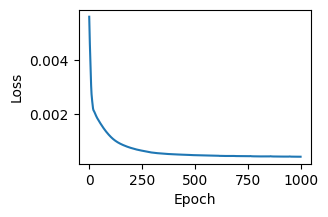

<Figure size 640x480 with 0 Axes>

In [16]:
import pandas as pd
import torch
from sentence_transformers import SentenceTransformer
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from torch import nn, optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm import tqdm

# Carregar o dataset
df = pd.read_csv('data/games_data.csv')

# remover linhas com valores nulos
df = df.dropna(subset=['description']).reset_index(drop=True)

descriptions = df['description'].tolist()

# Carregar o modelo pré-treinado SBERT
sbert_model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
pretrained_embeddings = sbert_model.encode(descriptions, convert_to_tensor=True)

# Define um autoencoder para ajuste fino
class EmbeddingAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(EmbeddingAutoencoder, self).__init__()
        self.encoder = nn.Linear(input_dim, hidden_dim)
        self.decoder = nn.Linear(hidden_dim, input_dim)

    def forward(self, x):
        x = F.relu(self.encoder(x))
        x = self.decoder(x)
        return x

# Parâmetros do autoencoder
input_dim = pretrained_embeddings.shape[1]
hidden_dim = 128
autoencoder = EmbeddingAutoencoder(input_dim, hidden_dim)
optimizer = optim.Adam(autoencoder.parameters(), lr=0.001)
criterion = nn.MSELoss()

losses = []
# Treinamento do autoencoder
embeddings_train, embeddings_val = train_test_split(pretrained_embeddings, test_size=0.2, random_state=42)
for epoch in tqdm(range(1000)): 
    autoencoder.train()
    optimizer.zero_grad()
    outputs = autoencoder(embeddings_train)
    loss = criterion(outputs, embeddings_train)
    loss.backward()
    optimizer.step()

    # Validação
    autoencoder.eval()
    val_outputs = autoencoder(embeddings_val)
    val_loss = criterion(val_outputs, embeddings_val)
    losses.append(loss.item())

# Embeddings ajustados
adjusted_embeddings = autoencoder.encoder(pretrained_embeddings).detach()

#salvar autoencoder
torch.save(autoencoder.state_dict(), 'autoencoder.pth')

# save embeddings
torch.save(adjusted_embeddings, 'data/adjusted_embeddings.pt')

plt.figure(figsize=(3,2))
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

# salvar gráfico de loss
plt.savefig('loss.png')


# Visualiação dos Embeddings

In [17]:
from sklearn.manifold import TSNE
import plotly.express as px

# Reduzir embeddings ajustados para 2D com TSNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d_pretrained = tsne.fit_transform(pretrained_embeddings)
embeddings_2d_adjusted = tsne.fit_transform(adjusted_embeddings)

# Criar DataFrame com dados necessários para visualização
df_visualization_pretrained = pd.DataFrame({
    'x': embeddings_2d_pretrained[:, 0],
    'y': embeddings_2d_pretrained[:, 1],
    'game_name': df['game_name'],
    'description': df['description']
})

df_visualization_adjusted = pd.DataFrame({
    'x': embeddings_2d_adjusted[:, 0],
    'y': embeddings_2d_adjusted[:, 1],
    'game_name': df['game_name'],
    'description': df['description']
})

# Plotar com Plotly
fig = px.scatter(
    df_visualization_pretrained, x='x', y='y', 
    hover_data={'game_name': True, 'description': False},
    title='Embeddings de Jogos (sBERT Pré-treinado)'
)
fig.update_traces(marker=dict(size=5))
#salvar em html
fig.write_html("data/plotly_pretrained.html")
fig.show()

fig = px.scatter(
    df_visualization_adjusted, x='x', y='y', 
    hover_data={'game_name': True, 'description': False},
    title='Embeddings de Jogos (sBERT Ajustado)'
)
fig.update_traces(marker=dict(size=5))
#salvar em html
fig.write_html("data/plotly_adjusted.html")
fig.show()


# Visualiação dos Embeddings ajustados separados por categorias

In [18]:
from sklearn.manifold import TSNE
import plotly.express as px

# Listas de palavras-chave para cada gênero de jogo
keywords = {
    'Horror': ['horror', 'survival', 'scary', 'fear', 'haunted'],
    'Shooter': ['fps', 'first-person shooter', 'shooter', 'gun', 'combat', 'war', 'battlefield', 'firearm'],
    'Racing': ['race', 'racing', 'driving', 'cars', 'track', 'vehicle'],
    'Sports': ['sports', 'soccer', 'basketball', 'football', 'golf', 'tennis', 'baseball', 'hockey'],
    'Fighting': ['fighting', 'fight', 'combat', 'martial arts', 'beat em up', 'brawler', 'duel', 'punch'],
    'Adventure': ['adventure', 'exploration', 'quest', 'journey', 'puzzle', 'platformer', 'narrative'],
    'Strategy': ['strategy', 'tactics', 'plan', 'simulation', 'management', 'warfare', 'defense', 'resource'],
    'RPG': ['rpg', 'role-playing', 'character', 'fantasy', 'magic', 'quests', 'level', 'skills', 'dungeon'],
    'Other': []  # Qualquer descrição que não se encaixe nas listas acima
}

# Função para categorizar com base nas palavras-chave
def categorize_game(description):
    description = description.lower()
    for category, words in keywords.items():
        if any(word in description for word in words):
            return category
    return 'Other'

# Criando a coluna de categoria no DataFrame
df['category'] = df['description'].apply(categorize_game)

# Reduzindo embeddings ajustados para 2D com TSNE
tsne = TSNE(n_components=2, random_state=42)
embeddings_2d = tsne.fit_transform(adjusted_embeddings)

# Criar DataFrame com dados necessários para visualização
df_visualization = pd.DataFrame({
    'x': embeddings_2d[:, 0],
    'y': embeddings_2d[:, 1],
    'game_name': df['game_name'],
    'description': df['description'],
    'category': df['category']  # Adicionando a categoria
})

# Plotar com Plotly, usando a coluna 'category' para colorir os pontos
fig = px.scatter(
    df_visualization, x='x', y='y', color='category',
    hover_data={'game_name': True, 'description': False},
    title='Embeddings de Jogos (sBERT Ajustado)'
)
fig.update_traces(marker=dict(size=5))

# Salvar em HTML
fig.write_html("data/plotly.html")
fig.show()


c:\Users\Marlon\AppData\Local\Programs\Python\Python310\lib\site-packages\plotly\express\_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



# Função de busca

In [28]:
from fastapi import FastAPI, Query
from sklearn.metrics.pairwise import cosine_similarity
import uvicorn

# Inicie a API
# app = FastAPI()

adjusted_embeddings = torch.load('data/adjusted_embeddings.pt')

# Função de busca usando similaridade do cosseno
def buscar_jogos(query, embeddings, df, top_n=10):
    query_embedding = autoencoder.encoder(sbert_model.encode([query], convert_to_tensor=True)).detach()
    similarities = cosine_similarity(query_embedding, embeddings)[0]
    indices_recomendados = similarities.argsort()[-top_n:][::-1]
    recomendacoes = [
        {
            "game_name": df.iloc[idx]['game_name'],
            "description": df.iloc[idx]['description'],
            "url": df.iloc[idx]['url'],
            "relevance": similarities[idx]
        }
        for idx in indices_recomendados if similarities[idx] > 0.84
    ]
    return recomendacoes

C:\Users\Marlon\AppData\Local\Temp\ipykernel_25708\3208650299.py:8: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



## Resposta com 10 resultados: "RPG"

In [30]:
query1 = "rpg"
recommendations1 = buscar_jogos(query1, adjusted_embeddings, df)
df_recommendations1 = pd.DataFrame(recommendations1)
df_recommendations1

,game_name,description,url,relevance
0,Deus Ex,"The game that incorporates RPG, action, advent...",https://www.metacritic.com/game/deus-ex/\n,0.986660
1,Etrian Odyssey Origins Collection,Explore the rich beginnings of this RPG franch...,https://www.metacritic.com/game/etrian-odyssey...,0.982939
2,Letter Quest: Grimm's Journey,Cross Scrabble with an RPG and see what you get.,https://www.metacritic.com/game/letter-quest-g...,0.982382
3,Crimson Gem Saga,"The game, a lovingly crafted exploration into ...",https://www.metacritic.com/game/crimson-gem-sa...,0.981232
4,Avernum 2: Crystal Souls,An indie fantasy role-playing adventure in a m...,https://www.metacritic.com/game/avernum-2-crys...,0.980565
5,Phantasy Star Collection,Relive the series that revolutionized RPG gami...,https://www.metacritic.com/game/phantasy-star-...,0.980317
6,Broforce,A ridiculously violent platform game about bei...,https://www.metacritic.com/game/broforce/\n,0.980285
7,Elderand,Explore a dangerous world and fight deadly cre...,https://www.metacritic.com/game/elderand/\n,0.980116
8,Darwinia+,Combining fast paced action with strategic bat...,https://www.metacritic.com/game/darwinia/\n,0.980041
9,Heroes of Might and Magic V,The first game to reintroduce the video game l...,https://www.metacritic.com/game/heroes-of-migh...,0.979917


## Resposta com menos de 10 resultados: "Educational"

In [32]:
query2 = "educational"
recommendations2 = buscar_jogos(query2, adjusted_embeddings, df)
df_recommendations2 = pd.DataFrame(recommendations2)
df_recommendations2

,game_name,description,url,relevance
0,As Far As The Eye,"You play as the Pupils, a civilization that mu...",https://www.metacritic.com/game/as-far-as-the-...,0.954830
1,The Legend of Heroes: Trails of Cold Steel,"At the elite Thors Military Academy, Erebonias...",https://www.metacritic.com/game/the-legend-of-...,0.947062
2,Kero Blaster,A classically-styled 2D side scrolling action ...,https://www.metacritic.com/game/keroblaster/\n,0.945708
3,Magical Starsign,The students of Will O'Wisp magical academy ha...,https://www.metacritic.com/game/magical-starsi...,0.944117
4,Werewolves Within,A game of social deduction that brings the fun...,https://www.metacritic.com/game/werewolves-wit...,0.943956
5,The Signifier,This psychological thriller journeys from the ...,https://www.metacritic.com/game/the-signifier/\n,0.943658
6,Dark Cloud 2,"[Known as ""Dark Chronicle"" in the UK] Live the...",https://www.metacritic.com/game/dark-cloud-2/\n,0.943583
7,Monster Rancher 3,The latest installment in the series lets play...,https://www.metacritic.com/game/monster-ranche...,0.943010
8,Dawn of Man,"Command a settlement of ancient humans, guide ...",https://www.metacritic.com/game/dawn-of-man/\n,0.942890
9,Inazuma Eleven Go: Shadow,Inazuma Eleven Go puts you at the center of a ...,https://www.metacritic.com/game/inazuma-eleven...,0.942847


## Resposta não óbvia: "Brazil"

In [33]:
query3 = "Brazil"
recommendations3 = buscar_jogos(query3, adjusted_embeddings, df)
df_recommendations3 = pd.DataFrame(recommendations3)
df_recommendations3

,game_name,description,url,relevance
0,World Tour Soccer 2003,"[Also known as ""This is Football 2002""] Featu...",https://www.metacritic.com/game/world-tour-soc...,0.932404
1,World Tour Soccer,Who knows where your next challenge will come ...,https://www.metacritic.com/game/world-tour-soc...,0.931101
2,RedCard 20-03,"Finally, a videogame that understands soccer r...",https://www.metacritic.com/game/redcard-20-03/\n,0.930784
3,World Tour Soccer 2002,"Known as ""This is Football 2002"" for its Europ...",https://www.metacritic.com/game/world-tour-soc...,0.927026
4,FIFA World Cup: Germany 2006,2006 FIFA World Cup features 12 official stadi...,https://www.metacritic.com/game/fifa-world-cup...,0.926808
5,2010 FIFA World Cup South Africa,EA SPORTS 2010 FIFA World Cup South Africa fea...,https://www.metacritic.com/game/2010-fifa-worl...,0.925400
6,FIFA Soccer 2004,A new Career Mode gives you the chance to take...,https://www.metacritic.com/game/fifa-soccer-20...,0.924161
7,F1 2017,"Win the 2017 World Championship, break every r...",https://www.metacritic.com/game/f1-2017/\n,0.922386
8,Pro Evolution Soccer 2,"North America, the wait is over. Experience th...",https://www.metacritic.com/game/pro-evolution-...,0.921550
9,Supreme Ruler 2010,The year is 2010 and the Major Powers of the w...,https://www.metacritic.com/game/supreme-ruler-...,0.921006
